In [1]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 6)

In [2]:
validatedf = pd.read_csv("test.csv")
df = pd.read_csv("train.csv")

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    30000 non-null  int64  
 1   race                  30000 non-null  object 
 2   date                  30000 non-null  object 
 3   time                  22965 non-null  object 
 4   circuit               30000 non-null  object 
 5   latitude              30000 non-null  float64
 6   longitude             30000 non-null  float64
 7   altitude              30000 non-null  int64  
 8   driver                30000 non-null  object 
 9   carNumber             30000 non-null  int64  
 10  constructor           30000 non-null  object 
 11  avgDriverFinish       30000 non-null  float64
 12  avgConstructorFinish  30000 non-null  float64
 13  lapNumber             30000 non-null  int64  
 14  lapPosition           30000 non-null  int64  
 15  pitStop            

In [29]:
mergedf = pd.concat([df, validatedf], ignore_index=True)

In [16]:
mergedf.describe()

,id,latitude,longitude,altitude,carNumber,avgDriverFinish,avgConstructorFinish,lapNumber,lapPosition,pitStop,pitCount,pitTime_ms,lapTime_ms
count,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,50714.000000,5.071400e+04,3.000000e+04
mean,25357.500000,34.619460,6.241621,341.484403,19.377430,10.995776,5.607739,29.955279,9.709922,0.022933,0.744055,3.001856e+03,9.445979e+04
std,14640.015113,22.121087,65.791315,503.285771,20.178558,4.706612,2.379248,18.289940,5.556325,0.149690,1.019343,6.557303e+04,6.375514e+04
min,1.000000,-37.849700,-99.090700,-7.000000,1.000000,2.711180,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000e+00,6.620000e+04
25%,12679.250000,30.132800,-8.626700,45.000000,7.000000,7.448925,3.033426,14.000000,5.000000,0.000000,0.000000,0.000000e+00,8.127850e+04
50%,25357.500000,43.734700,6.947500,162.000000,14.000000,10.140187,5.246659,29.000000,9.000000,0.000000,0.000000,0.000000e+00,9.049250e+04
75%,38035.750000,47.578900,19.248600,401.000000,22.000000,13.823529,7.268041,44.000000,14.000000,0.000000,1.000000,0.000000e+00,1.004710e+05
max,50714.000000,52.388800,144.968000,2227.000000,99.000000,25.052632,11.736842,78.000000,24.000000,1.000000,6.000000,2.077164e+06,2.253574e+06


In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
df= df.drop(['latitude','longitude', 'id', 'carNumber', 'date', 'time', 'race'], axis=1)

In [4]:
validatedf = validatedf.drop(['latitude','longitude', 'id', 'carNumber', 'date', 'time', 'race'], axis=1)

In [5]:
validatedf.head()

,circuit,altitude,driver,constructor,avgDriverFinish,avgConstructorFinish,lapNumber,lapPosition,pitStop,pitCount,pitTime_ms
0,Nürburgring,578,"Glock, Timo",Virgin,17.725490,11.736842,35,18,0,1,0.0
1,Red Bull Ring,678,"Sainz, Carlos",Ferrari,9.011429,2.833984,22,2,0,0,0.0
2,Suzuka Circuit,45,"Fisichella, Giancarlo",Jordan,10.196507,6.771784,21,14,0,0,0.0
3,Circuit Park Zandvoort,6,"Russell, George",Williams,13.308511,5.246659,52,12,0,1,0.0
4,Silverstone Circuit,153,"Vettel, Sebastian",Ferrari,5.839465,2.833984,47,3,0,2,0.0


In [6]:
#one-hot the circuit, driver, constuctor in both
# Identify the unique set of categorical values across both DataFrames
unique_driver_names = set(df['driver']).union(set(validatedf['driver']))

# Combine both DataFrames
combined_df = pd.concat([df, validatedf], ignore_index=True)

# One-hot encoding using the combined set of categorical values
combined_df_encoded = pd.get_dummies(combined_df, columns=['driver', 'constructor', 'circuit'])


# Split the combined DataFrame back into original shapes
df_encoded = combined_df_encoded.head(len(df))
validatedf_encoded = combined_df_encoded.tail(len(validatedf))



In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Assuming df is your training DataFrame and 'lapTime_ms' is the target variable
X = df_encoded.drop('lapTime_ms', axis=1)
y = df_encoded['lapTime_ms']

# Step 1: Split the data into training and testing sets for cross-validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Define the Random Forest model
rf_model = RandomForestRegressor()

# Step 3: Set up hyperparameter tuning using GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Step 4: Get the best hyperparameters and train the model on the full training set
best_rf_model = grid_search.best_estimator_
# Get the best hyperparameters
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Hyperparameters:", best_params)
print("Best Score:", best_score)




Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best Score: -2070204221.782339


In [48]:
# Step 5: Evaluate the model on the test set (optional)
y_pred = best_rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error on Test Set: {mse}')

# Step 6: Train the model on the full dataset (no test set) using cross-validation
predicted_laptimes = cross_val_predict(best_rf_model, X, y, cv=5)

# Now, you have a trained model with the best hyperparameters, and predicted_laptimes contains the predicted lap times for each sample.

# Step 7: Use the trained model to predict lap times on the validatedf DataFrame
X_valid = validatedf_encoded.drop(['lapTime_ms'], axis=1)
predicted_laptimes_valid = best_rf_model.predict(X_valid)

# The predicted_laptimes_valid now contains the predicted lap times for the samples in the validatedf DataFrame.


Mean Squared Error on Test Set: 957204333.3416827


In [49]:
predicted_laptimes_valid

array([102044.8818381 ,  71223.98856564,  97176.90692516, ...,
       114230.47912302, 130346.99411184,  86340.85139385])

C:\Users\ajed8\AppData\Local\Temp\ipykernel_36360\3767140013.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  feature_names = df_encoded.drop(['lapTime_ms'], 1).columns


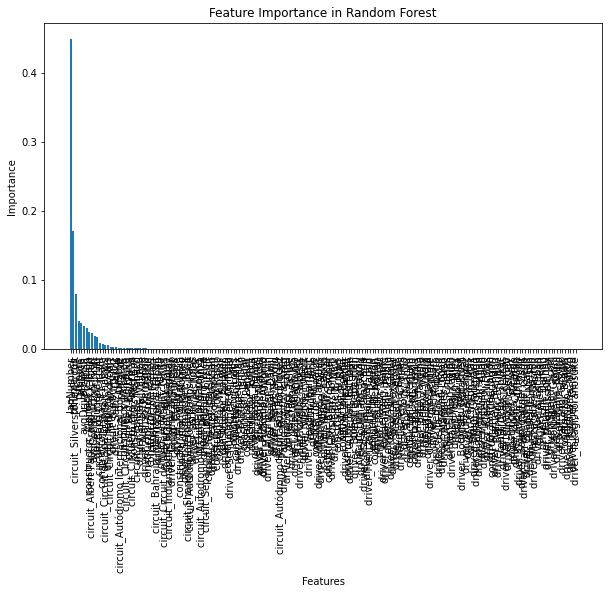

In [14]:
# Get feature importances
importances = best_rf_model.feature_importances_
indices = np.argsort(importances)[::-1]  # Sort feature indices in descending order

# Get feature names
feature_names = df_encoded.drop(['lapTime_ms'], 1).columns

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), importances[indices])
plt.xticks(range(X.shape[1]), feature_names[indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.title("Feature Importance in Random Forest")
plt.show()

In [16]:
# Sort feature importances and feature names in descending order
indices = np.argsort(best_rf_model.feature_importances_)[::-1]
sorted_feature_names = [feature_names[i] for i in indices]
sorted_feature_importances = rf.feature_importances_[indices]

# Calculate cumulative importance
cumulative_importance = np.cumsum(sorted_feature_importances)

# Print feature names and cumulative importance scores
for feature_name, importance_score, cumulative_score in zip(sorted_feature_names, sorted_feature_importances, cumulative_importance):
    print(f"{feature_name}: Importance = {importance_score:.4f}, Cumulative Importance = {cumulative_score:.4f}")


lapNumber: Importance = 0.3510, Cumulative Importance = 0.3510
pitTime_ms: Importance = 0.2050, Cumulative Importance = 0.5559
circuit_Silverstone Circuit: Importance = 0.2358, Cumulative Importance = 0.7917
pitCount: Importance = 0.0506, Cumulative Importance = 0.8423
altitude: Importance = 0.0321, Cumulative Importance = 0.8745
avgDriverFinish: Importance = 0.0266, Cumulative Importance = 0.9011
lapPosition: Importance = 0.0165, Cumulative Importance = 0.9176
constructor_Alpine F1 Team: Importance = 0.0102, Cumulative Importance = 0.9278
circuit_Albert Park Grand Prix Circuit: Importance = 0.0187, Cumulative Importance = 0.9465
avgConstructorFinish: Importance = 0.0065, Cumulative Importance = 0.9529
driver_Tsunoda, Yuki: Importance = 0.0024, Cumulative Importance = 0.9553
circuit_Baku City Circuit: Importance = 0.0069, Cumulative Importance = 0.9622
constructor_Haas F1 Team: Importance = 0.0013, Cumulative Importance = 0.9636
circuit_Circuit de Spa-Francorchamps: Importance = 0.0066

In [22]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create a Random Forest classifier
best_rf_model.fit(X_train, y_train)


# Evaluate the model on the test set using regression metrics
y_pred = best_rf_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

Mean Squared Error: 957204333.3416827
R-squared: 0.7029289498861518


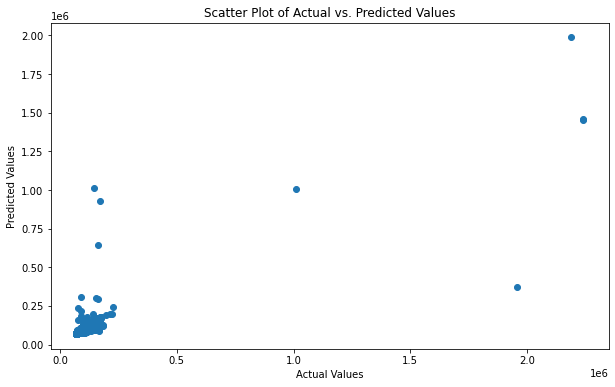

In [50]:

# Assuming y_test and y_pred are your actual and predicted values in milliseconds
y_test_seconds = y_test / 10000  # Convert milliseconds to seconds
y_pred_seconds = y_pred / 10000
# Assuming y_test and y_pred are your actual and predicted values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values')
plt.show()